In [1]:
import matplotlib.pyplot as plt
import numpy as np
from model_util_scannet_CIL_37 import ScannetDatasetConfig
from scannet_detection_dataset_CIL_object import ScannetDetectionDataset
from memory_bank_object import Memory_Bank_Object
import plotly.graph_objects as go
import numpy as np

import random
SEED = 42
random.seed(SEED)

In [2]:
# load object_reservoir from 'object_reservoir.pth'
with open('object_reservoir.pth', 'rb') as f:
    object_reservoir = np.load(f, allow_pickle=True)

# initialize config
config = ScannetDatasetConfig()

TOTAL_BUDGET = 1000
LOAD_PATH = 'object_reservoir.pth'
mbo = Memory_Bank_Object(total_budget=TOTAL_BUDGET, load_path=LOAD_PATH)


mbo.update_memory(budget=-1, classes=[0, 1, 2, 3, 4, 5, 6], criteria='random')
# print the length of the memory bank
print(len(mbo))
# print the 8th object in the memory bank
# print(mbo[obj_idx_check])

Adding 1000 objects to the memory bank.
1000


scene_name scene0005_01
object_id 9
object_class 1
chair


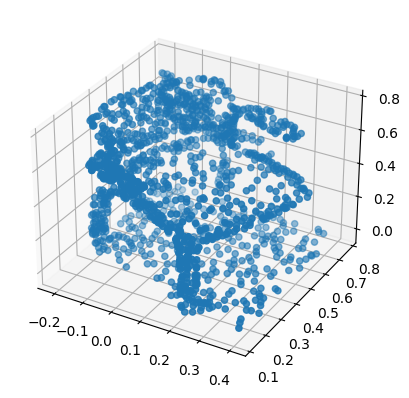

In [3]:
obj_idx_check = 0
object_0 = mbo[obj_idx_check]
for key in object_0.keys():
    if key != 'object_point_cloud':
        print(key, object_0[key])
object_type = config.class2type[object_0['object_class']]
print(object_type)
# visualize object_0['object_point_cloud']
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(object_0['object_point_cloud'][:,0], object_0['object_point_cloud'][:,1], object_0['object_point_cloud'][:,2])
plt.show()

scene_name scene0075_00
object_id 4
object_class 1
chair


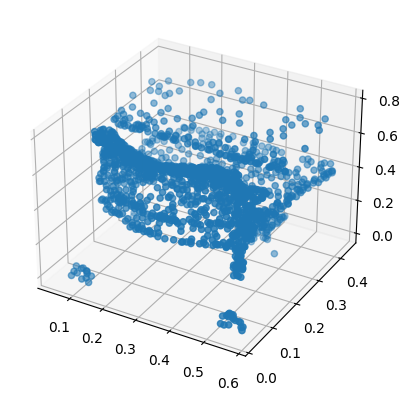

In [11]:
obj_idx_check = 1
object_0 = mbo[obj_idx_check]
for key in object_0.keys():
    if key != 'object_point_cloud':
        print(key, object_0[key])
object_type = config.class2type[object_0['object_class']]
print(object_type)
# visualize object_0['object_point_cloud']
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(object_0['object_point_cloud'][:,0], object_0['object_point_cloud'][:,1], object_0['object_point_cloud'][:,2])
plt.show()

In [4]:
CIL_STAGE = [7,8,9,10,11,12,13]
dset = ScannetDetectionDataset(split_set='train', num_points=40000,
        use_color=True, use_height=False, augment=False, CIL_stage=CIL_STAGE, memory_bank=mbo) # use color = True for debugging

kept 1201 scans out of 1201


In [5]:
s0_i1 = dset[0]
point_cloud, instance_bboxes = s0_i1

In [6]:
instance_bboxes[0]

array([ 1.87789476,  1.4445982 ,  0.696401  ,  0.18099165,  1.33715868,
        1.00396442, 38.        ])

In [10]:
# use plotly to visualize the point cloud and the bounding boxes
# for the points, the rgb values are stored in the last 3 columns
fig = go.Figure(data=[go.Scatter3d(x=point_cloud[:,0], y=point_cloud[:,1], z=point_cloud[:,2], mode='markers', marker=dict(size=1, color=point_cloud[:,3:6], opacity=0.8))])
# the bounding box format is [center_x, center_y, center_z, dx, dy, dz, nyu40_class]
# convert the bounding box to coordinates of the 8 corners and plot the bounding box
for index, bbox in enumerate(instance_bboxes):
    # skip unless it is the last object in instance_bboxes
    if index < len(instance_bboxes) - 2:
        continue
    center_x, center_y, center_z, dx, dy, dz, _ = bbox
    corners = np.array([[-1, -1, -1], [1, -1, -1], [1, 1, -1], [-1, 1, -1], [-1, -1, 1], [1, -1, 1], [1, 1, 1], [-1, 1, 1]]) * np.array([dx, dy, dz]) / 2
    corners = corners + np.array([center_x, center_y, center_z])
    # connect the corners
    lines = [[0, 1], [1, 2], [2, 3], [3, 0],
             [4, 5], [5, 6], [6, 7], [7, 4],
             [0, 4], [1, 5], [2, 6], [3, 7]]
    for line in lines:
        fig.add_trace(go.Scatter3d(x=[corners[line[0], 0], corners[line[1], 0]], y=[corners[line[0], 1], corners[line[1], 1]], z=[corners[line[0], 2], corners[line[1], 2]], mode='lines'))

fig.show()

# visualize the bounding boxes
                                                                              


In [8]:
# the .npy file saves only one object (due to a bug in saving multiple objects). It is for visualization only

# object_reservoir = np.load('object_reservoir.npy', allow_pickle=True)

# # convert to a dictionary
# object_reservoir = object_reservoir.item()

# pc = object_reservoir['object_point_cloud']
# # plot the point cloud
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# ax.scatter(pc[:, 0], pc[:, 1], pc[:, 2], s=1)
# ax.set_xlabel('X')
# ax.set_ylabel('Y')
# ax.set_zlabel('Z')
# plt.show()



In [9]:
# list_40 = [6721, 4357, 2026, 1985, 1554, 1427, 1271, 1255, 1031, 928, 745, 661, 657, 614, 551, 486, 481, 406, 390, 386, 364, 307, 300, 292, 279, 253, 251, 216, 201, 190, 186, 177, 170, 116, 113, 52, 39, 32, 22]
# print(sum(list_40)) # 29579
# print(len(list_40)) # 40